# Let's Dive into CNNs
## Please read the following paragraph I copy-pasted from ChatGPT:
Welcome back to the exciting world of Convolutional Neural Networks (CNN), building on our previous question which focused on Multilayer Perceptrons (MLP)! As you already know, CNNs are a powerful tool for image and video processing applications. They are designed to recognize patterns and features in visual data, making them a popular choice in computer vision research. One of the reasons why CNNs are preferred over MLPs for image recognition tasks is their ability to handle high-dimensional input data, which preserves spatial information by applying convolutional filters to detect patterns and features at different locations in the input data.

One of the reasons why CNNs are preferred over MLPs for image recognition tasks is their ability to handle high-dimensional input data. MLPs are limited in their ability to process images because they require that the input data be flattened into a one-dimensional vector, which can result in a loss of important spatial information. In contrast, CNNs are designed to handle multi-dimensional data such as images, preserving spatial information by applying convolutional filters to detect patterns and features at different locations in the input data.

In this assignment, we will be playing with the CIFAR-10 dataset to explore different CNN models. We will start by training an auto-encoder for CIFAR images. This auto-encoder will allow us to compare different models, including a Multilayer Perceptron (MLP) model, a CNN-MLP mixed model, and finally a CNN-only model. By comparing the performance of these models, we can gain a deeper understanding of the importance of CNN layers in image processing tasks.

Once we've completed our auto-encoder experiments, we will use the encoder from the best-performing model to train a Siamese network. Siamese networks are a type of neural network that can recognize similarity between two images, making them a popular choice for tasks such as image retrieval and face recognition. By training a Siamese network using the CIFAR-10 dataset, we can gain a better understanding of how CNNs can be used in more complex image recognition tasks.

Overall, this assignment will allow us to explore the many different applications of CNNs in image processing tasks. We'll have the opportunity to experiment with different architectures, compare their performance, and gain valuable insights into how CNNs can be used to solve real-world problems.

🫵Pro-tip: Utilize learnings from previous question to better solve problems in this question.

💭Trivia: Yes, I am allowed use ChatGPT!

## Part 0: Initialization
### Step zero: Import Libraries

In [3]:
# code here
import numpy as np
import pandas as pd
import matplotlib
import seaborn as sns
%matplotlib inline
import os
import torch
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets
from torchvision import transforms
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from tqdm import tqdm
from tabulate import tabulate
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from google.colab import drive
from torchsummary import summary

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


### Step one: Using a PyTorch Dataset
Load CIFAR-10 dataset from `torchvision.datasets`. Keep batch_size >= 16.

In [5]:
# code here
BATCH_SIZE = 128
transform = transforms.Compose([
                    transforms.ToTensor(), 
            ])

trainset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
testset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

trainloader = DataLoader(trainset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
testloader = DataLoader(testset, batch_size= BATCH_SIZE, shuffle=False, num_workers=2)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


torch.Size([128, 3, 32, 32])
torch.Size([128])


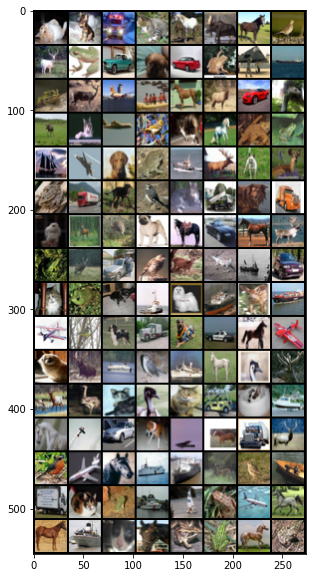

In [6]:
# let's have a look at the dataset
def imshow(img):
    img = img #/ 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

print(images.shape)
print(labels.shape)

# show images
imshow(torchvision.utils.make_grid(images))

## Part 1: Auto-Encoder
### Step one: Define 3 Models for Auto-Encoder
1. MLP-only model
2. CNN-MLP combination model
3. CNN-only model

In all the models, encoder and decoder should be consisting of $3$ layers each, and the encoder should be giving a flattened representation of size $32$.

Please see that each layer of encoder should decrease or keep equal the output size as compared to input size. Similarly, each layer of decoder should increase or keep equal the output size as compared to input size. 

In [7]:
class MLPAutoEncoder(nn.Module):
    def __init__(self, input_size):
        super(MLPAutoEncoder, self).__init__()
        self.batch_size = BATCH_SIZE
        self.h1 = 1028
        self.h2 = 256
        self.final_size = 32

        self.encoder = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_size, self.h1, device = device),
            nn.ReLU(),
            nn.Linear(self.h1, self.h2, device=device),
            nn.ReLU(),
            nn.Linear(self.h2, self.final_size, device =device)
        )

        self.decoder = nn.Sequential(
            nn.Linear(self.final_size, self.h2, device=device),
            nn.ReLU(),
            nn.Linear(self.h2, self.h1),
            nn.ReLU(),
            nn.Linear(self.h1, input_size, device=device),
            nn.Unflatten(1, (3,32,32)),
            nn.Sigmoid()
        )

    def forward(self, x):
        enc = self.encoder(x)
        dec = self.decoder(enc)
        return enc, dec

class ComboAutoEncoder(nn.Module):
    #### NOTE ###############
    #### TRY CHANGING KERNEL SIZES AND PADDING VALUES #######
    ###########################################
    def __init__(self):
        super(ComboAutoEncoder, self).__init__()
        self.batch_size = BATCH_SIZE
        self.h1 = 1028
        self.h2 = 256
        self.final_size = 32
        self.channels = 8
        self.kernel_size = 2
        self.padding_val = 0

        self.encoder = nn.Sequential(
            nn.Conv2d(3, self.channels, self.kernel_size, stride=2, padding=self.padding_val),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(8*16*16, self.h2, device=device),
            nn.ReLU(),
            nn.Linear(self.h2, self.final_size, device=device)
        )

        self.decoder = nn.Sequential(
            nn.Linear(self.final_size, self.h2, device=device),
            nn.ReLU() ,
            nn.Linear(self.h2, 8*16*16),
            nn.Unflatten(1, (8,16,16)),
            nn.ConvTranspose2d(self.channels,3,self.kernel_size, stride=2,padding=self.padding_val),
            nn.Sigmoid()
        )

    def forward(self, x):
        enc = self.encoder(x)
        dec = self.decoder(enc)
        return enc, dec    

class CNNAutoEncoder(nn.Module):
    def __init__(self):
        super(CNNAutoEncoder, self).__init__()
        self.channel1 = 16
        self.channel2 = 12
        self.channel3 = 8

        self.conv1 = nn.Conv2d(3, self.channel1, 3, padding=1)
        self.conv2 = nn.Conv2d(self.channel1, self.channel2, 3, padding=1)
        self.conv3 = nn.Conv2d(self.channel2, self.channel3, 4, padding=1, stride=2)
        self.pool = nn.MaxPool2d(2, 2, return_indices=True)
        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1, (8,2,2))
        self.conv4 = nn.ConvTranspose2d(self.channel3, self.channel2, 4, padding=1, stride=2)
        self.conv5 = nn.ConvTranspose2d(self.channel2, self.channel1, 3, padding=1)
        self.conv6 = nn.ConvTranspose2d(self.channel1, 3, 3, padding=1)
        self.unpool = nn.MaxUnpool2d(2,2)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x, ind1 = self.pool(x)

        x = self.conv2(x)
        x = self.relu(x)
        x, ind2 = self.pool(x)

        x = self.conv3(x)
        x, ind3 = self.pool(x)

        x = self.flatten(x)
        x = self.unflatten(x)

        x = self.unpool(x, ind3)
        x = self.conv4(x)

        x = self.unpool(x, ind2)
        x = self.conv5(x)
        x = self.relu(x)

        x = self.unpool(x, ind1)
        x = self.conv6(x)
        # x = self.relu(x)

        x  = self.sigmoid(x)

        return x,x

In [ ]:
comb = CNNAutoEncoder().to(device)
summary(comb, (3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             448
              ReLU-2           [-1, 16, 32, 32]               0
         MaxPool2d-3  [[-1, 16, 16, 16], [-1, 16, 16, 16]]               0
            Conv2d-4           [-1, 12, 16, 16]           1,740
              ReLU-5           [-1, 12, 16, 16]               0
         MaxPool2d-6  [[-1, 12, 8, 8], [-1, 12, 8, 8]]               0
            Conv2d-7              [-1, 8, 4, 4]           1,544
         MaxPool2d-8  [[-1, 8, 2, 2], [-1, 8, 2, 2]]               0
           Flatten-9                   [-1, 32]               0
        Unflatten-10              [-1, 8, 2, 2]               0
      MaxUnpool2d-11              [-1, 8, 4, 4]               0
  ConvTranspose2d-12             [-1, 12, 8, 8]           1,548
      MaxUnpool2d-13           [-1, 12, 16, 16]               0
  ConvTranspose2

### Step two: Using MSELoss, train all the models and analyse results
Make sure you also discuss size, time-taken and any other differences you found. Plot MSELoss for each epoch for all models. Also, tabulate the final MSELosses of all models and plot it vis-a-vis:

1. Model Size
2. Model Parameters
3. Time Taken per epoch 

In [8]:
# code here
def plot_losses(train_loss,val_loss,name):

  x_data=np.arange(0,len(train_loss))
  plt.plot(x_data,train_loss,label="train")
  plt.plot(x_data,val_loss,label="validation")
  plt.legend()
  plt.title(name)
  plt.show()

  return
  
def reconstruct_imgs(model):
  dataiter = iter(trainloader)
  images, labels = next(dataiter)

  _,prediction=model(images.to(device))
  print("Original")
  imshow(torchvision.utils.make_grid(images))
  print("Predictions")
  imshow(torchvision.utils.make_grid(prediction.cpu()))

In [9]:
def train_models_auto(model, name, num_epochs=10):
    optimiser = optim.Adam(model.parameters(), lr=1e-3)
    loss_func = nn.MSELoss().to(device)
    train_loss, val_loss = list(), list()

    for epoch in range(num_epochs):
        model.train()
        x = 0
        for batch_idx, (data, target) in enumerate(trainloader):
            data = data.to(device)

            optimiser.zero_grad()

            e, d = model(data)
            loss = loss_func(d, data)
            x += loss.cpu().data.item()
            loss.backward()
            optimiser.step()
        x = x / len(trainloader)
        train_loss.append(x)

        model.eval()
        with torch.no_grad():
            x = 0
            for batch_idx, (data, target) in enumerate(testloader):
                data = data.to(device)

                e,d = model(data)
                loss = loss_func(d, data)
                x += loss.item()
            x = x/len(testloader)
            val_loss.append(x)
        print("Epoch: {}, Train Loss: {:.4f}, Test Loss: {:.4f}".format(epoch+1,train_loss[-1],val_loss[-1]))
        
    plot_losses(train_loss, val_loss, name)
    reconstruct_imgs(model)
    return model

Epoch: 1, Train Loss: 0.0304, Test Loss: 0.0238
Epoch: 2, Train Loss: 0.0210, Test Loss: 0.0195
Epoch: 3, Train Loss: 0.0182, Test Loss: 0.0173
Epoch: 4, Train Loss: 0.0166, Test Loss: 0.0161
Epoch: 5, Train Loss: 0.0156, Test Loss: 0.0152
Epoch: 6, Train Loss: 0.0149, Test Loss: 0.0149
Epoch: 7, Train Loss: 0.0143, Test Loss: 0.0141
Epoch: 8, Train Loss: 0.0138, Test Loss: 0.0139
Epoch: 9, Train Loss: 0.0134, Test Loss: 0.0134
Epoch: 10, Train Loss: 0.0132, Test Loss: 0.0136


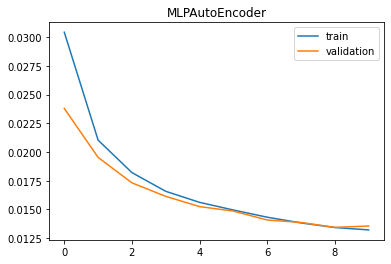

Original


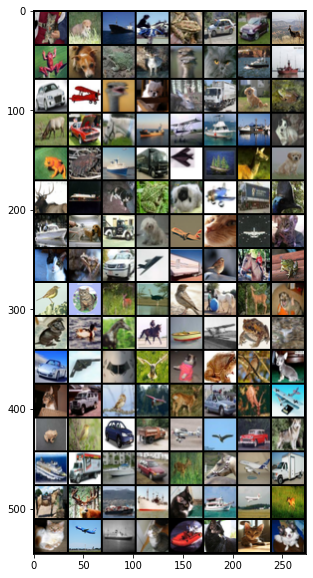

Predictions


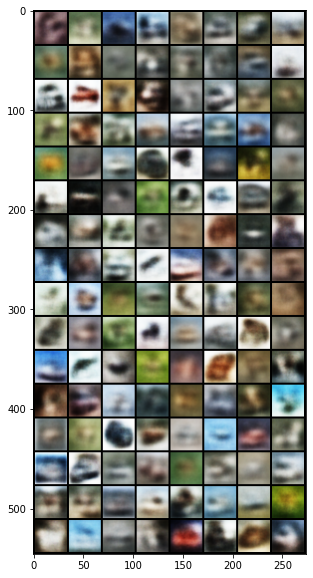

In [ ]:
dimensions = 3*32*32
model = MLPAutoEncoder(dimensions).to(device)
model1 = train_models_auto(model, 'MLPAutoEncoder')

Epoch: 1, Train Loss: 0.0285, Test Loss: 0.0204
Epoch: 2, Train Loss: 0.0180, Test Loss: 0.0164
Epoch: 3, Train Loss: 0.0153, Test Loss: 0.0146
Epoch: 4, Train Loss: 0.0140, Test Loss: 0.0137
Epoch: 5, Train Loss: 0.0132, Test Loss: 0.0131
Epoch: 6, Train Loss: 0.0129, Test Loss: 0.0129
Epoch: 7, Train Loss: 0.0127, Test Loss: 0.0128
Epoch: 8, Train Loss: 0.0127, Test Loss: 0.0127
Epoch: 9, Train Loss: 0.0126, Test Loss: 0.0127
Epoch: 10, Train Loss: 0.0126, Test Loss: 0.0127


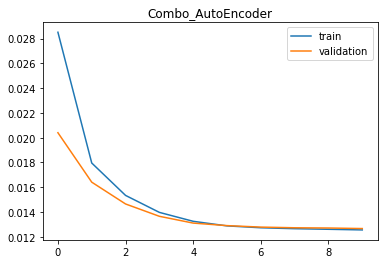

Original


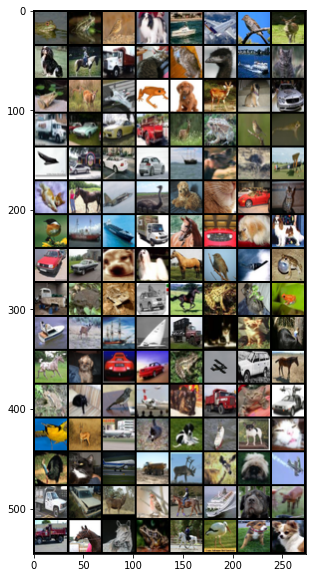

Predictions


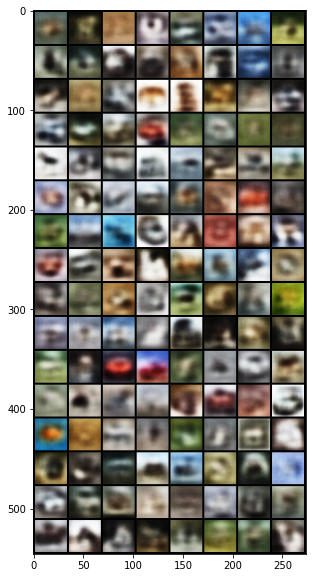

In [ ]:
model = ComboAutoEncoder().to(device)
model2 = train_models_auto(model, 'Combo_AutoEncoder')

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    Exception ignored in: if w.is_alive():
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
<function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
    assert self._parent_pid == os.getpid(), 'can only test a child process'Traceback (most recent call last):

AssertionError: can only test a child process  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    
self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
Exception ignored in:     if w.is_alive():<

Epoch: 1, Train Loss: 0.0302, Test Loss: 0.0166


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>if w.is_alive():
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__

      File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
self._shutdown_workers()
      File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError    can only test a child process: if w.is_alive():

  File "/usr/lib/pytho

Epoch: 2, Train Loss: 0.0152, Test Loss: 0.0144


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Traceback (most recent call last):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    Traceback (most recent call last):
self._shutdown_workers()  File "/usr/local/lib/python3.

Epoch: 3, Train Loss: 0.0140, Test Loss: 0.0134


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Exception ignored in: Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__

    self._shutdown_workers()Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__

  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
        if w.is_alive():
self._shutdown_workers()  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    assert self._parent_pid == os.getpid(), 'can only test a child process'if w.is_alive():

  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in

Epoch: 4, Train Loss: 0.0124, Test Loss: 0.0119


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
Exception ignored in:   File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
<function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
    if w.is_alive():
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
Traceback (most recent call last):
      File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
assert self._parent_pid == os.getpid(), 'can only test a child process'    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    
if w.is_alive():
AssertionError  File "/usr/lib/python3.9/multiprocessing/process.py"

Epoch: 5, Train Loss: 0.0115, Test Loss: 0.0113


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>if w.is_alive():

  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()    
assert self._parent_pid == os.getpid(), 'can only test a child process'
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
AssertionError  File "/usr/lib/python3.9/multiprocessing/process.py"

Epoch: 6, Train Loss: 0.0110, Test Loss: 0.0108


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Traceback (most recent call last):
Exception ignored in:   File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
self._shutdown_workers()
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
        if w.is_alive():self._shutdown_workers()
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    assert self._parent_pid == os.getpid(), 'can only test a child process'
if w.is_alive():AssertionError
  File "/usr/lib/python3.9/multiprocessing/process.py"

Epoch: 7, Train Loss: 0.0107, Test Loss: 0.0106


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/pytho

Epoch: 8, Train Loss: 0.0105, Test Loss: 0.0104


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>if w.is_alive():
Traceback (most recent call last):

  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
        self._shutdown_workers()assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError
:   File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
can only test a child process    
if w.is_alive():
Exception ignored in: 

Epoch: 9, Train Loss: 0.0104, Test Loss: 0.0103


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Exception ignored in: Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers

    if w.is_alive():    self._shutdown_workers()

  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'    if w.is_alive():
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in 

Epoch: 10, Train Loss: 0.0102, Test Loss: 0.0101


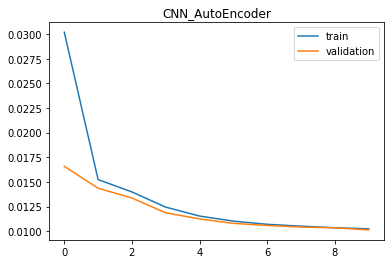

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7feaa52fec10>Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__

    Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
self._shutdown_workers()  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers

  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
        if w.is_alive():if w.is_alive():

  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in 

Original


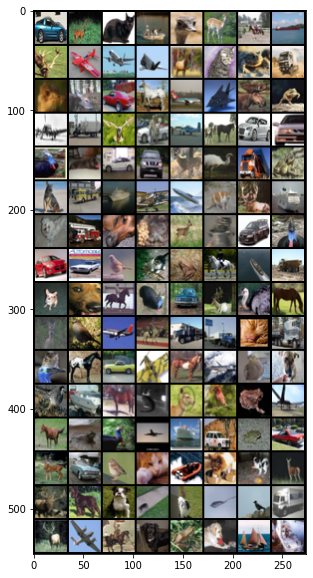

Predictions


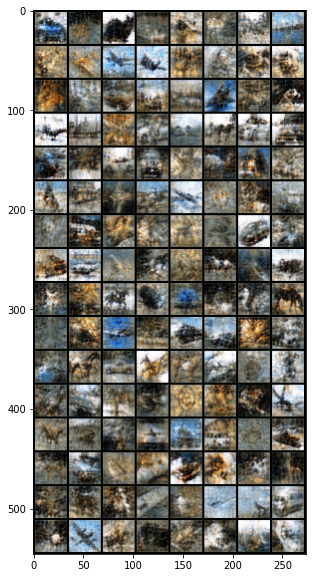

In [ ]:
model = CNNAutoEncoder().to(device)
model3 = train_models_auto(model, 'CNN_AutoEncoder')

In [ ]:
# Utilize the following code
#--------------MLP--------------#
dataiter = iter(testloader)
images, labels = next(dataiter)
# print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(5)))
imshow(torchvision.utils.make_grid(images))

images = Variable(images)

print("Reconstructed image")
decoded_imgs = model1(images)[1]
imshow(torchvision.utils.make_grid(decoded_imgs.data))

#--------------Combo--------------#
dataiter = iter(testloader)
images, labels = next(dataiter)
# print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(5)))
imshow(torchvision.utils.make_grid(images))

images = Variable(images)

print("Reconstructed image")
decoded_imgs = model2(images)[1]
imshow(torchvision.utils.make_grid(decoded_imgs.data))

#--------------CNN--------------#
dataiter = iter(testloader)
images, labels = next(dataiter)
# print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(5)))
imshow(torchvision.utils.make_grid(images))

images = Variable(images)

print("Reconstructed image")
decoded_imgs = model3(images)[1]
imshow(torchvision.utils.make_grid(decoded_imgs.data))

## analysis

#### MLP Auto-Encoder
Test Loss: 0.0136

Number of parameters: 3,428,896

Size: 13.21 MB

#### Combined Auto-Encoder
Test Loss: 0.0127

Number of parameters: 805,481

Size: 3.21 MB

#### CNN Auto-Encoder
Test Loss: 0.0101

Number of parameters: 7,459

Size: 132.19 MB

We observe that the number of parameters decrease as we replace the linear layers with convolution layers. This is because CNN uses convolution layers that help decrease the number of parameters. However, the size of CNN model is much higher than MLP or Combo model because the Forward/backward pass size of CNN autoencoders tends to be larger than MLP autoencoders because of the spatial information present in images. CNN exploits the spatial correlations between neighboring pixels.

We observe that the test loss is least for CNN autoencoder as expected. Even the reconstructed images look better for the CNN autoencoder. This is because CNN autoencoder is able to preserve the spatial information of the image. The MLP autoencoder is not able to preserve the spatial information of the image and hence the reconstructed image is not as good as the CNN autoencoder. The Combo autoencoder has only 1 convolution layer and 2 linear layers. Thus, the recontructed image is not as good as the CNN autoencoder.

#### Time Taken
MLP Auto-Encoder: 2m

Combined Auto-Encoder: 2m

CNN Auto-Encoder: 2m

### Step three: Let's play with Representation Sizes
Spoilers: You must have found CNN to be more effective.

Have you ever wondered how varying the size of a CNN auto-encoder's representation can affect its performance? If so, here's a challenge for you: Implement a CNN auto-encoder with different representation sizes and observe the impact on the reconstruction quality.

Play with the following representation sizes:
1. 10
2. 32
3. 100
4. 1000

When working with different representation sizes in a CNN auto-encoder, we may reach a point of diminishing returns where increasing the representation size does not lead to significant improvements in reconstruction quality. This can be due to factors such as increased model complexity and longer training times. Discuss where you feel we might reach this point of diminishing returns when working with CIFAR-10 dataset and varying representation sizes.

Do analysis as suggested earlier.

In [10]:
# code and analysis here
class CNNAutoEncoder_10(nn.Module):
    def __init__(self):
        super(CNNAutoEncoder_10, self).__init__()
        self.channel1 = 16
        self.channel2 = 8
        self.channel3 = 5

        self.conv1 = nn.Conv2d(3, self.channel1, 3, padding=1)
        self.conv2 = nn.Conv2d(self.channel1, self.channel2, 3, padding=1)
        self.conv3 = nn.Conv2d(self.channel2, self.channel3, (4,8), padding=1, stride=2)
        self.pool = nn.MaxPool2d(2, 2, return_indices=True)
        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1, (5,2,1))
        self.conv4 = nn.ConvTranspose2d(self.channel3, self.channel2, (4,8), padding=1, stride=2)
        self.conv5 = nn.ConvTranspose2d(self.channel2, self.channel1, 3, padding=1)
        self.conv6 = nn.ConvTranspose2d(self.channel1, 3, 3, padding=1)
        self.unpool = nn.MaxUnpool2d(2,2)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x, ind1 = self.pool(x) # 16*16*16

        x = self.conv2(x)
        x = self.relu(x)
        x, ind2 = self.pool(x) # 8*8*8

        x = self.conv3(x)
        x, ind3 = self.pool(x) # 5*2*1

        x = self.flatten(x) # 10
        y = None
        y = self.unflatten(x) # 5*2*1

        y = self.unpool(y, ind3)
        y = self.conv4(y)

        y = self.unpool(y, ind2)
        y = self.conv5(y)
        y = self.relu(y)

        y = self.unpool(y, ind1)
        y = self.conv6(y)
        # y = self.relu(y)

        y  = self.sigmoid(y)

        return x,y

# code and analysis here
class CNNAutoEncoder_100(nn.Module):
    def __init__(self):
        super(CNNAutoEncoder_100, self).__init__()
        self.channel1 = 16
        self.channel2 = 20
        self.channel3 = 25

        self.conv1 = nn.Conv2d(3, self.channel1, 3, padding=1)
        self.conv2 = nn.Conv2d(self.channel1, self.channel2, 4, padding=1, stride=2)
        self.conv3 = nn.Conv2d(self.channel2, self.channel3, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2, return_indices=True)
        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1, (25,2,2))
        self.conv4 = nn.ConvTranspose2d(self.channel3, self.channel2, 3, padding=1)
        self.conv5 = nn.ConvTranspose2d(self.channel2, self.channel1, 4, padding=1, stride=2)
        self.conv6 = nn.ConvTranspose2d(self.channel1, 3, 3, padding=1)
        self.unpool = nn.MaxUnpool2d(2,2)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x, ind1 = self.pool(x) # 16*16*16

        x = self.conv2(x)
        x = self.relu(x)
        x, ind2 = self.pool(x) # 20*4*4

        x = self.conv3(x)
        x, ind3 = self.pool(x) # 25*2*2

        x = self.flatten(x) # 100
        y=None
        y = self.unflatten(x)

        y = self.unpool(y, ind3)
        y = self.conv4(y)

        y = self.unpool(y, ind2)
        y = self.conv5(y)
        y = self.relu(y)

        y = self.unpool(y, ind1)
        y = self.conv6(y)
        # y = self.relu(y)

        y  = self.sigmoid(y)

        return x,y

class CNNAutoEncoder_1000(nn.Module):
    def __init__(self):
        super(CNNAutoEncoder_1000, self).__init__()
        self.channel1 = 16
        self.channel2 = 48
        self.channel3 = 125

        self.conv1 = nn.Conv2d(3, self.channel1, 3, padding=1)
        self.conv2 = nn.Conv2d(self.channel1, self.channel2, 3, padding=1)
        self.conv3 = nn.Conv2d(self.channel2, self.channel3, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2, return_indices=True)
        self.pool2 = nn.MaxPool2d((2,6), 2, return_indices=True)
        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1, (125, 4, 2))
        self.conv4 = nn.ConvTranspose2d(self.channel3, self.channel2, 3, padding=1)
        self.conv5 = nn.ConvTranspose2d(self.channel2, self.channel1, 3, padding=1)
        self.conv6 = nn.ConvTranspose2d(self.channel1, 3, 3, padding=1)
        self.unpool = nn.MaxUnpool2d(2,2)
        self.unpool2 = nn.MaxUnpool2d((2,6), 2)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x, ind1 = self.pool(x)

        x = self.conv2(x)
        x = self.relu(x)
        x, ind2 = self.pool(x)

        x = self.conv3(x)
        x, ind3 = self.pool2(x) 

        x = self.flatten(x)
        y=None
        y = self.unflatten(x)

        y = self.unpool2(y, ind3)
        y = self.conv4(y)

        y = self.unpool(y, ind2)
        y = self.conv5(y)
        y = self.relu(y)

        y = self.unpool(y, ind1)
        y = self.conv6(y)
        # y = self.relu(y)

        y  = self.sigmoid(y)

        return x,y

In [11]:
cnn_ = CNNAutoEncoder_1000().to(device)
summary(cnn_, (3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             448
              ReLU-2           [-1, 16, 32, 32]               0
         MaxPool2d-3  [[-1, 16, 16, 16], [-1, 16, 16, 16]]               0
            Conv2d-4           [-1, 48, 16, 16]           6,960
              ReLU-5           [-1, 48, 16, 16]               0
         MaxPool2d-6  [[-1, 48, 8, 8], [-1, 48, 8, 8]]               0
            Conv2d-7            [-1, 125, 8, 8]          54,125
         MaxPool2d-8  [[-1, 125, 4, 2], [-1, 125, 4, 2]]               0
           Flatten-9                 [-1, 1000]               0
        Unflatten-10            [-1, 125, 4, 2]               0
      MaxUnpool2d-11            [-1, 125, 8, 8]               0
  ConvTranspose2d-12             [-1, 48, 8, 8]          54,048
      MaxUnpool2d-13           [-1, 48, 16, 16]               0
  ConvTransp

Epoch: 1, Train Loss: 0.0314, Test Loss: 0.0198
Epoch: 2, Train Loss: 0.0184, Test Loss: 0.0177
Epoch: 3, Train Loss: 0.0170, Test Loss: 0.0165
Epoch: 4, Train Loss: 0.0162, Test Loss: 0.0159
Epoch: 5, Train Loss: 0.0155, Test Loss: 0.0152
Epoch: 6, Train Loss: 0.0150, Test Loss: 0.0150
Epoch: 7, Train Loss: 0.0146, Test Loss: 0.0144
Epoch: 8, Train Loss: 0.0143, Test Loss: 0.0141
Epoch: 9, Train Loss: 0.0140, Test Loss: 0.0139
Epoch: 10, Train Loss: 0.0138, Test Loss: 0.0137


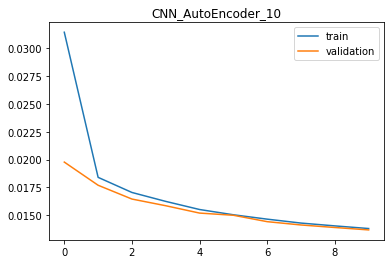

Original


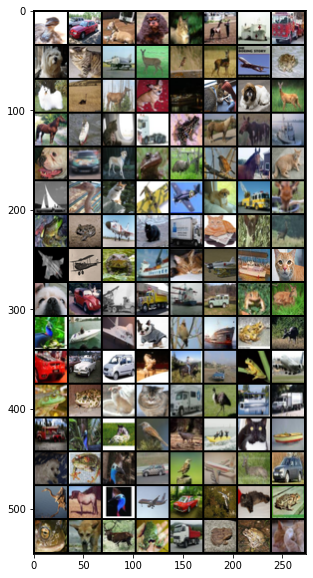

Predictions


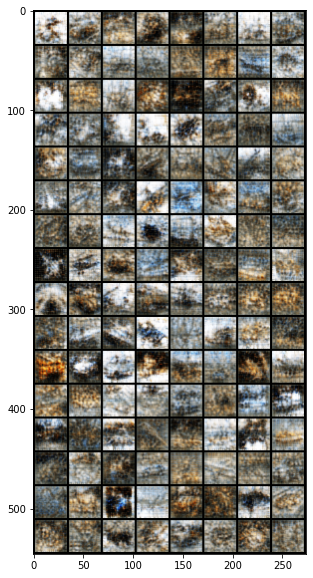

In [ ]:
model = CNNAutoEncoder_10().to(device)
model3 = train_models_auto(model, 'CNN_AutoEncoder_10')

Epoch: 1, Train Loss: 0.0275, Test Loss: 0.0166
Epoch: 2, Train Loss: 0.0138, Test Loss: 0.0123
Epoch: 3, Train Loss: 0.0114, Test Loss: 0.0107
Epoch: 4, Train Loss: 0.0103, Test Loss: 0.0099
Epoch: 5, Train Loss: 0.0096, Test Loss: 0.0093
Epoch: 6, Train Loss: 0.0091, Test Loss: 0.0089
Epoch: 7, Train Loss: 0.0087, Test Loss: 0.0086
Epoch: 8, Train Loss: 0.0085, Test Loss: 0.0084
Epoch: 9, Train Loss: 0.0082, Test Loss: 0.0081
Epoch: 10, Train Loss: 0.0080, Test Loss: 0.0079


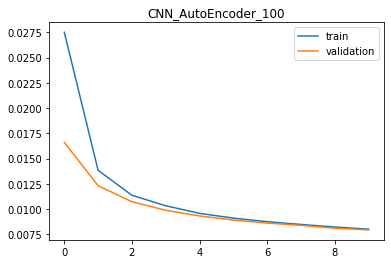

Original


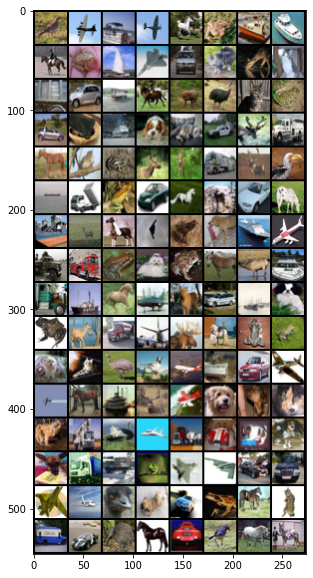

Predictions


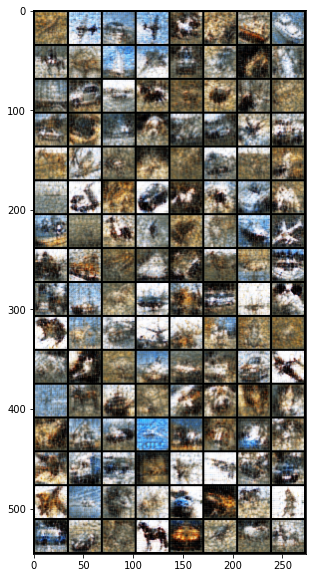

In [ ]:
model = CNNAutoEncoder_100().to(device)
model3 = train_models_auto(model, 'CNN_AutoEncoder_100')

Epoch: 1, Train Loss: 0.0168, Test Loss: 0.0072
Epoch: 2, Train Loss: 0.0060, Test Loss: 0.0053
Epoch: 3, Train Loss: 0.0050, Test Loss: 0.0047
Epoch: 4, Train Loss: 0.0043, Test Loss: 0.0042
Epoch: 5, Train Loss: 0.0039, Test Loss: 0.0037
Epoch: 6, Train Loss: 0.0036, Test Loss: 0.0035
Epoch: 7, Train Loss: 0.0034, Test Loss: 0.0034
Epoch: 8, Train Loss: 0.0033, Test Loss: 0.0033
Epoch: 9, Train Loss: 0.0033, Test Loss: 0.0032
Epoch: 10, Train Loss: 0.0032, Test Loss: 0.0032


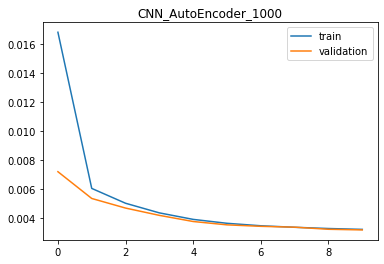

Original


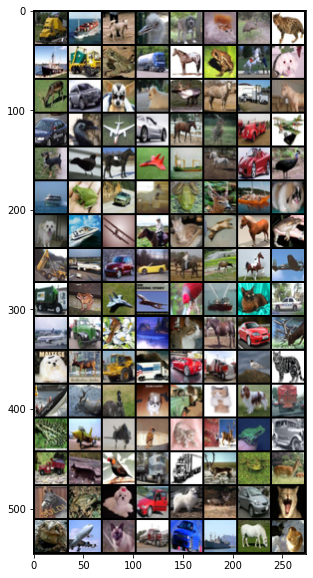

Predictions


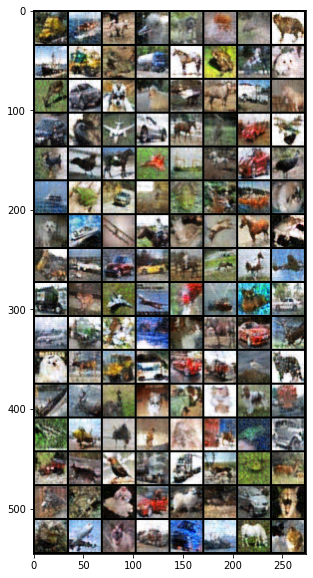

In [ ]:
model = CNNAutoEncoder_1000().to(device)
model3 = train_models_auto(model, 'CNN_AutoEncoder_1000')

### Analysis

We observe that the reconstructed images look better when we increase the representation size (while keeping the same number of layers = 3). This is because when we increase the representation size of an autoencoder, we allow it to learn more complex and detailed representations of the input data. This means that the encoder can capture more features and patterns in the data, and the decoder can generate more accurate reconstructions.

However, increasing the representation size too much might lead to overfitting.

We see that there is a significant improvement in the reconstructed images when we increase the representation size from 10 to 100. However, there is not much improvement in the reconstructed images when we increase the representation size from 100 to 1000.

### Step four: What about the number of layers?

Experimenting with different numbers of layers in the encoder and decoder of a CNN auto-encoder can have a significant impact on its performance with CIFAR-10 dataset. For our next challenge, let's explore how the number of layers can affect the quality of the reconstructed images. Would a deeper or shallower network be more effective for this task?

Play with the following numbers of layers for encoder and decoder each:
1. 1
2. 3
3. 5
4. 10

When experimenting with different numbers of layers in the encoder and decoder of a CNN auto-encoder, we may reach a point of diminishing returns where adding more layers does not result in significant improvements in reconstruction quality. Additionally, deeper networks may be prone to overfitting, especially when training data is limited. Discuss where you feel we reach it. 

Do analysis as suggested earlier.

In [12]:
# code and analysis here
class CNNAutoEncoder_1(nn.Module):
    def __init__(self):
        super(CNNAutoEncoder_1, self).__init__()
        self.channel1 = 16
        self.channel2 = 48
        self.channel3 = 125

        self.conv1 = nn.Conv2d(3, self.channel1, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2, return_indices=True)
        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1, (16,16,16))
        self.conv2 = nn.ConvTranspose2d(self.channel1, 3, 3, padding=1)
        self.unpool = nn.MaxUnpool2d(2,2)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x, ind1 = self.pool(x)
        x = self.flatten(x)
        y=None
        y = self.unflatten(x)
        y = self.unpool(y, ind1)
        y = self.conv2(y)

        y  = self.sigmoid(y)

        return x,y

class CNNAutoEncoder_3(nn.Module):
    def __init__(self):
        super(CNNAutoEncoder_3, self).__init__()
        self.channel1 = 16
        self.channel2 = 20
        self.channel3 = 25

        self.conv1 = nn.Conv2d(3, self.channel1, 3, padding=1)
        self.conv2 = nn.Conv2d(self.channel1, self.channel2, 4, padding=1, stride=2)
        self.conv3 = nn.Conv2d(self.channel2, self.channel3, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2, return_indices=True)
        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1, (25,2,2))
        self.conv4 = nn.ConvTranspose2d(self.channel3, self.channel2, 3, padding=1)
        self.conv5 = nn.ConvTranspose2d(self.channel2, self.channel1, 4, padding=1, stride=2)
        self.conv6 = nn.ConvTranspose2d(self.channel1, 3, 3, padding=1)
        self.unpool = nn.MaxUnpool2d(2,2)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x, ind1 = self.pool(x) # 16*16*16

        x = self.conv2(x)
        x = self.relu(x)
        x, ind2 = self.pool(x) # 20*4*4

        x = self.conv3(x)
        x, ind3 = self.pool(x) # 25*2*2

        x = self.flatten(x) # 100
        y=None
        y = self.unflatten(x)

        y = self.unpool(y, ind3)
        y = self.conv4(y)

        y = self.unpool(y, ind2)
        y = self.conv5(y)
        y = self.relu(y)

        y = self.unpool(y, ind1)
        y = self.conv6(y)
        # y = self.relu(y)

        y  = self.sigmoid(y)

        return x, y

class CNNAutoEncoder_5(nn.Module):
    def __init__(self):
        super(CNNAutoEncoder_5, self).__init__()
        self.channel1 = 16
        self.channel2 = 32
        self.channel3 = 64
        self.channel4 = 128
        self.channel5 = 256

        self.conv1 = nn.Conv2d(3, self.channel1, 3, padding=1)
        self.conv2 = nn.Conv2d(self.channel1, self.channel2, 3, padding=1)
        self.conv3 = nn.Conv2d(self.channel2, self.channel3, 3, padding=1)
        self.conv4 = nn.Conv2d(self.channel3, self.channel4, 3, padding=1)
        self.conv5 = nn.Conv2d(self.channel4, self.channel5, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2, return_indices=True)
        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1, (self.channel5,4,4))
        self.conv6 = nn.ConvTranspose2d(self.channel5, self.channel4, 3, padding=1)
        self.conv7 = nn.ConvTranspose2d(self.channel4, self.channel3, 3, padding=1)
        self.conv8 = nn.ConvTranspose2d(self.channel3, self.channel2, 3, padding=1)
        self.conv9 = nn.ConvTranspose2d(self.channel2, self.channel1, 3, padding=1)
        self.conv10 = nn.ConvTranspose2d(self.channel1, 3, 3, padding=1)
        self.unpool = nn.MaxUnpool2d(2,2)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        # x, ind1 = self.pool(x)

        x = self.conv2(x)
        x = self.relu(x)
        # x, ind2 = self.pool(x)

        x = self.conv3(x)
        x = self.relu(x)
        x, ind1 = self.pool(x)

        x = self.conv4(x)
        x = self.relu(x)
        x, ind2 = self.pool(x)

        x = self.conv5(x)
        x = self.relu(x)
        x, ind3 = self.pool(x)

        x = self.flatten(x) 
        y=None
        y = self.unflatten(x)

        y = self.unpool(y, ind3)
        y = self.conv6(y)

        y = self.unpool(y, ind2)
        y = self.conv7(y)
        y = self.relu(y)

        y = self.unpool(y, ind1)
        y = self.conv8(y)
        y = self.relu(y)

        y = self.conv9(y)
        y = self.relu(y)

        y = self.conv10(y)
        y  = self.sigmoid(y)

        return x, y

class CNNAutoEncoder_10_l(nn.Module):
    def __init__(self):
        super(CNNAutoEncoder_10_l, self).__init__()
        self.channel1 = 16
        self.channel2 = 32
        self.channel3 = 64
        self.channel4 = 128
        self.channel5 = 256
        self.channel6 = 512

        self.conv1 = nn.Conv2d(3, self.channel1, 3, padding=1)
        self.conv2 = nn.Conv2d(self.channel1, self.channel2, 3, padding=1)
        self.conv3 = nn.Conv2d(self.channel2, self.channel3, 3, padding=1)
        self.conv4 = nn.Conv2d(self.channel3, self.channel3, 3, padding=1)
        self.conv5 = nn.Conv2d(self.channel3, self.channel4, 3, padding=1)
        self.conv6 = nn.Conv2d(self.channel4, self.channel4, 3, padding=1)
        self.conv7 = nn.Conv2d(self.channel4, self.channel5, 3, padding=1)
        self.conv8 = nn.Conv2d(self.channel5, self.channel5, 3, padding=1)
        self.conv9 = nn.Conv2d(self.channel5, self.channel6, 3, padding=1)
        self.conv10 = nn.Conv2d(self.channel6, self.channel6, 3, padding=1)

        self.pool = nn.MaxPool2d(2, 2, return_indices=True)
        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1, (self.channel6,2,2))

        self.conv11 = nn.ConvTranspose2d(self.channel6, self.channel6, 3, padding=1)
        self.conv12 = nn.ConvTranspose2d(self.channel6, self.channel5, 3, padding=1)
        self.conv13 = nn.ConvTranspose2d(self.channel5, self.channel5, 3, padding=1)
        self.conv14 = nn.ConvTranspose2d(self.channel5, self.channel4, 3, padding=1)
        self.conv15 = nn.ConvTranspose2d(self.channel4, self.channel4, 3, padding=1)
        self.conv16 = nn.ConvTranspose2d(self.channel4, self.channel3, 3, padding=1)
        self.conv17 = nn.ConvTranspose2d(self.channel3, self.channel3, 3, padding=1)
        self.conv18 = nn.ConvTranspose2d(self.channel3, self.channel2, 3, padding=1)
        self.conv19 = nn.ConvTranspose2d(self.channel2, self.channel1, 3, padding=1)
        self.conv20 = nn.ConvTranspose2d(self.channel1, 3, 3, padding=1)


        self.unpool = nn.MaxUnpool2d(2,2)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        # x, ind1 = self.pool(x)

        x = self.conv2(x)
        x = self.relu(x)
        # x, ind2 = self.pool(x)

        x = self.conv3(x)
        x = self.relu(x)
        # x, ind1 = self.pool(x)

        x = self.conv4(x)
        x = self.relu(x)
        x, ind1 = self.pool(x)

        x = self.conv5(x)
        x = self.relu(x)

        x = self.conv6(x)
        x = self.relu(x)
        x, ind2 = self.pool(x)

        x = self.conv7(x)
        x = self.relu(x)

        x = self.conv8(x)
        x = self.relu(x)
        x, ind3 = self.pool(x)

        x = self.conv9(x)
        x = self.relu(x)

        x = self.conv10(x)
        x, ind4 = self.pool(x)

        x = self.flatten(x) 
        y=None
        y = self.unflatten(x)

        y = self.unpool(y, ind4)
        y = self.conv11(y)

        y = self.conv12(y)
        y = self.relu(y)

        y = self.unpool(y, ind3)
        y = self.conv13(y)
        y = self.relu(y)

        y = self.conv14(y)
        y = self.relu(y)

        y = self.unpool(y, ind2)
        y = self.conv15(y)
        y = self.relu(y)

        y = self.conv16(y)
        y = self.relu(y)

        y = self.unpool(y, ind1)
        y = self.conv17(y)
        y = self.relu(y)

        y = self.conv18(y)
        y = self.relu(y)

        y = self.conv19(y)
        y = self.relu(y)

        y = self.conv20(y)
        y = self.sigmoid(y)

        return x, y

In [ ]:
cnn_ = CNNAutoEncoder_10_l().to(device)
summary(cnn_, (3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             448
              ReLU-2           [-1, 16, 32, 32]               0
            Conv2d-3           [-1, 32, 32, 32]           4,640
              ReLU-4           [-1, 32, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]          18,496
              ReLU-6           [-1, 64, 32, 32]               0
            Conv2d-7           [-1, 64, 32, 32]          36,928
              ReLU-8           [-1, 64, 32, 32]               0
         MaxPool2d-9  [[-1, 64, 16, 16], [-1, 64, 16, 16]]               0
           Conv2d-10          [-1, 128, 16, 16]          73,856
             ReLU-11          [-1, 128, 16, 16]               0
           Conv2d-12          [-1, 128, 16, 16]         147,584
             ReLU-13          [-1, 128, 16, 16]               0
        MaxPool2d-14  [[-1, 

Epoch: 1, Train Loss: 0.0229, Test Loss: 0.0070
Epoch: 2, Train Loss: 0.0052, Test Loss: 0.0041
Epoch: 3, Train Loss: 0.0037, Test Loss: 0.0034
Epoch: 4, Train Loss: 0.0033, Test Loss: 0.0032
Epoch: 5, Train Loss: 0.0031, Test Loss: 0.0030
Epoch: 6, Train Loss: 0.0030, Test Loss: 0.0029
Epoch: 7, Train Loss: 0.0028, Test Loss: 0.0028
Epoch: 8, Train Loss: 0.0027, Test Loss: 0.0026
Epoch: 9, Train Loss: 0.0026, Test Loss: 0.0025
Epoch: 10, Train Loss: 0.0025, Test Loss: 0.0025


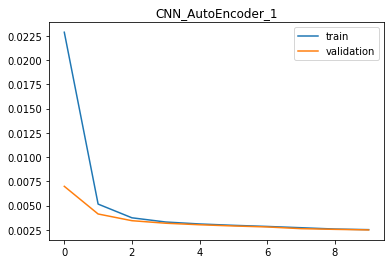

Original


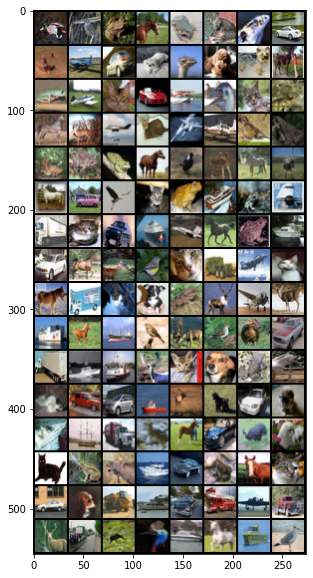

Predictions


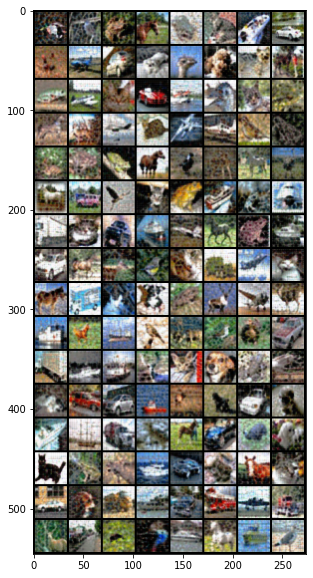

In [ ]:
model11 = CNNAutoEncoder_1().to(device)
model11 = train_models_auto(model11, 'CNN_AutoEncoder_1')

Epoch: 1, Train Loss: 0.0267, Test Loss: 0.0145
Epoch: 2, Train Loss: 0.0131, Test Loss: 0.0118
Epoch: 3, Train Loss: 0.0109, Test Loss: 0.0101
Epoch: 4, Train Loss: 0.0097, Test Loss: 0.0093
Epoch: 5, Train Loss: 0.0090, Test Loss: 0.0087
Epoch: 8, Train Loss: 0.0081, Test Loss: 0.0080
Epoch: 9, Train Loss: 0.0079, Test Loss: 0.0079
Epoch: 10, Train Loss: 0.0078, Test Loss: 0.0078


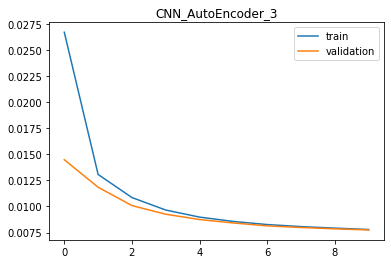

Original


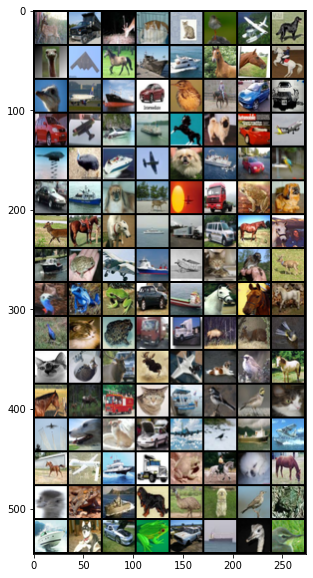

Predictions


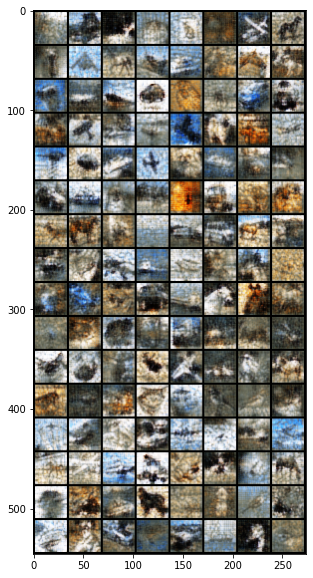

In [ ]:
model12 = CNNAutoEncoder_3().to(device)
model12 = train_models_auto(model12, 'CNN_AutoEncoder_3')

Epoch: 1, Train Loss: 0.0104, Test Loss: 0.0036
Epoch: 2, Train Loss: 0.0031, Test Loss: 0.0036
Epoch: 3, Train Loss: 0.0022, Test Loss: 0.0019
Epoch: 4, Train Loss: 0.0017, Test Loss: 0.0016
Epoch: 5, Train Loss: 0.0015, Test Loss: 0.0015
Epoch: 6, Train Loss: 0.0014, Test Loss: 0.0019
Epoch: 7, Train Loss: 0.0013, Test Loss: 0.0013
Epoch: 8, Train Loss: 0.0013, Test Loss: 0.0014
Epoch: 9, Train Loss: 0.0012, Test Loss: 0.0011
Epoch: 10, Train Loss: 0.0011, Test Loss: 0.0012


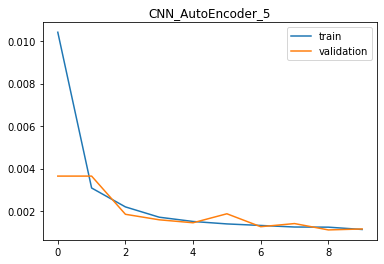

Original


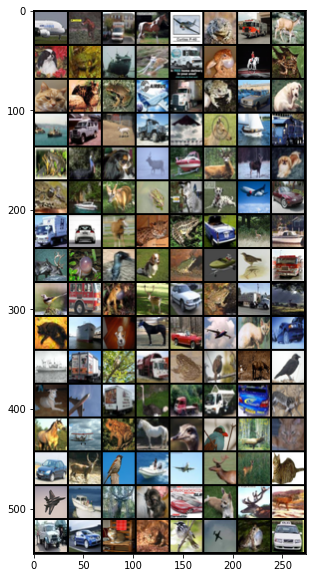

Predictions


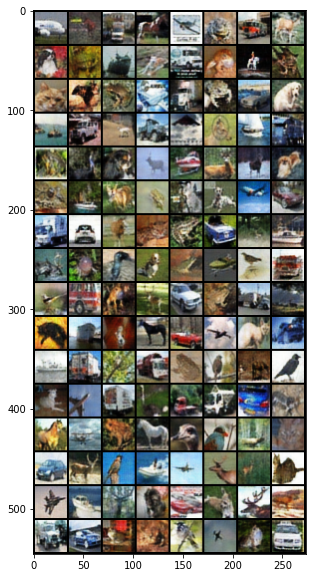

In [ ]:
model13 = CNNAutoEncoder_5().to(device)
model13 = train_models_auto(model13, 'CNN_AutoEncoder_5')

Epoch: 1, Train Loss: 0.0295, Test Loss: 0.0134
Epoch: 2, Train Loss: 0.0110, Test Loss: 0.0096
Epoch: 3, Train Loss: 0.0105, Test Loss: 0.0177
Epoch: 4, Train Loss: 0.0480, Test Loss: 0.0434
Epoch: 5, Train Loss: 0.0431, Test Loss: 0.0422
Epoch: 6, Train Loss: 0.0428, Test Loss: 0.0426
Epoch: 7, Train Loss: 0.0424, Test Loss: 0.0415
Epoch: 8, Train Loss: 0.0417, Test Loss: 0.0412
Epoch: 9, Train Loss: 0.0411, Test Loss: 0.0408
Epoch: 10, Train Loss: 0.0402, Test Loss: 0.0397


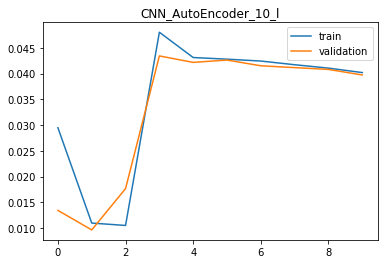

Original


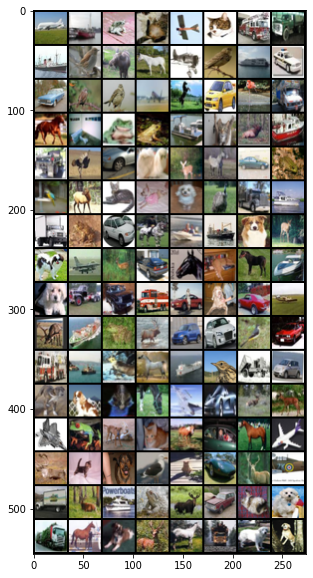

Predictions


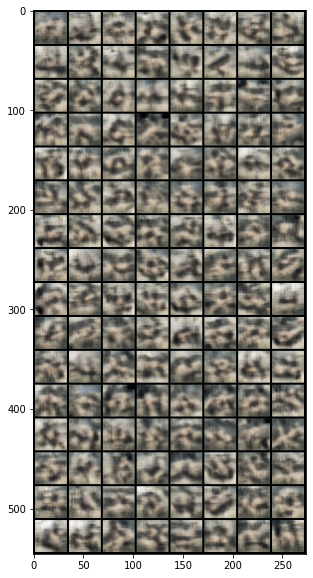

In [ ]:
model14 = CNNAutoEncoder_10_l().to(device)
model14 = train_models_auto(model14, 'CNN_AutoEncoder_10_l')

### Analysis

We observe that increase in the number of layers gives better reconstructed images till an extent (layers = 5) and then the reconstructed images start to degrade (layers = 10). This is because when we increase the number of layers, we allow the autoencoder to learn more complex and detailed representations of the input data. However, increasing the number of layers too much might lead to overfitting.

### Explaination time!
Please write a short-essay explaining what AutoEncoder does, how it is different from other data-representation methods like PCA, t-SNE and Variational AutoEncoders. Also tell what were your take-outs from this experiment.

### Answer

Autoencoder is a type of neural network that learns a compressed representation of the input data without supervision. It consists of two main parts, an encoder and a decoder, which are trained together to reconstruct the input data as accurately as possible.

The encoder maps the input data to a lower dimensional representation, while the decoder maps this compressed representation back to the original input shape. By minimizing the difference between the original and reconstructed data, the autoencoder learns to capture the most important features and patterns of the input data.

Autoencoders are different from other data-representation methods like PCA, t-SNE, and Variational AutoEncoders (VAEs) in several ways.

PCA and Autoencoder are both methods for dimensionality reduction, but PCA is a linear statistical technique, whereas Autoencoder is a nonlinear neural network architecture. PCA finds the directions of maximum variance in the data and projects the data onto a lower-dimensional subspace, while Autoencoder learns an efficient data representation by reconstructing the input data.

Autoencoders are useful for feature extraction, compression, and anomaly detection, while t-SNE is primarily used for data visualization. Additionally, t-SNE requires all the data to be loaded into memory, making it computationally expensive for large datasets, whereas autoencoders can handle large datasets using mini-batch training.

While both autoencoders and VAEs are used for unsupervised learning and can learn useful representations of data, VAEs are generative models that can generate new data and provide a measure of uncertainty, while autoencoders are mainly used for data compression and reconstruction.
Another difference between autoencoders and VAEs is the way they perform encoding and decoding. In autoencoders, the encoding and decoding functions are usually implemented as deterministic neural networks. In VAEs, the encoding and decoding functions are probabilistic, with the encoding function mapping the input to a mean and standard deviation of a Gaussian distribution and the decoding function sampling from that distribution to generate an output.

## Part 2: The return of kNN
Autoencoder representations can be useful for a wide range of machine learning tasks beyond just reconstructing input data. For example, the output of an encoder can be used as a feature representation for classification using k-Nearest Neighbors (kNN) or other classifiers. Similarly, the encoded representations can be used for unsupervised tasks like clustering, where the model groups similar images together based on their feature representation. This makes autoencoders a versatile tool for feature learning, with the potential to enhance the performance of a wide range of machine learning algorithms.

Since we have already trained auto-encoder on CIFAR-10, we will employ the encoder from the CNN model with representation size of $10$. Using a subset of CIFAR-10 train and test datasets, each with 10,000 and 1000 samples respectively, with an equal number of samples for each class, implement kNN classification using the encoder output as features. Share your findings and accuracy, F1 score and other relavant metrics on the test set. What insights can you draw from the results?

You are allowed to use sklearn or any other library for kNN and splitting dataset.

In [13]:
# code and analysis here. Remember to keep your analysis of high quality at all times.
from torch.utils.data import TensorDataset, DataLoader

num_samples_per_class = 1000

# Define the number of classes
num_classes = 10

In [15]:
def load_data():
    x =  datasets.CIFAR10(root='./data', train=True, download=True)
    y =  datasets.CIFAR10(root='./data', train=False, download=True)
    return x, y

train_dataset, test_dataset = load_data()

Files already downloaded and verified
Files already downloaded and verified


In [17]:
def transform(data):
    l = list()
    for ind, i in enumerate(data):
        try:
            l.append(np.transpose(np.array(i), (2,1,0)))
        except:
            pass
    return l

In [19]:
def get_indices(dataset, x, i):
    return np.where(np.array(dataset.targets) == i)[0][:x]

def new_data(train_dataset, test_dataset, a,b,c,d):
    for i in range(num_classes):
        tr_ind = get_indices(train_dataset, 1000, i)
        te_ind = get_indices(test_dataset, 100, i)

        a.extend([train_dataset.data[index] for index in tr_ind])
        b.extend([train_dataset.targets[index] for index in tr_ind])
        c.extend([test_dataset.data[index] for index in te_ind])
        d.extend([test_dataset.targets[index] for index in te_ind])

    return a,b,c,d

In [20]:
new_train_dataset, new_train_dataset_target, new_test_dataset, new_test_dataset_target = list(),list(),list(),list()
new_train_dataset, new_train_dataset_target, new_test_dataset, new_test_dataset_target = new_data(train_dataset, test_dataset, new_train_dataset, new_train_dataset_target, new_test_dataset, new_test_dataset_target)

new_train_dataset=transform(new_train_dataset)
print((new_train_dataset[0].shape))
train_dataset_ = TensorDataset(torch.Tensor((new_train_dataset)),torch.Tensor((new_train_dataset_target))) # create your datset
new_train_loader = DataLoader(train_dataset_,batch_size=BATCH_SIZE,num_workers=2) # create your dataloader

new_test_dataset=transform(new_test_dataset)
print((new_test_dataset[0].shape))
test_dataset_ = TensorDataset(torch.Tensor((new_test_dataset)),torch.Tensor((new_test_dataset_target))) # create your datset
new_test_loader = DataLoader(test_dataset_,batch_size=BATCH_SIZE,num_workers=2) # create your dataloader

(3, 32, 32)
(3, 32, 32)


Epoch: 1, Train Loss: 0.0314, Test Loss: 0.0205
Epoch: 2, Train Loss: 0.0190, Test Loss: 0.0179
Epoch: 3, Train Loss: 0.0173, Test Loss: 0.0166
Epoch: 4, Train Loss: 0.0162, Test Loss: 0.0158
Epoch: 5, Train Loss: 0.0155, Test Loss: 0.0152
Epoch: 6, Train Loss: 0.0150, Test Loss: 0.0149
Epoch: 7, Train Loss: 0.0147, Test Loss: 0.0146
Epoch: 8, Train Loss: 0.0144, Test Loss: 0.0143
Epoch: 9, Train Loss: 0.0142, Test Loss: 0.0142
Epoch: 10, Train Loss: 0.0139, Test Loss: 0.0136


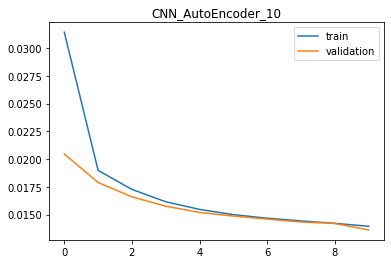

Original


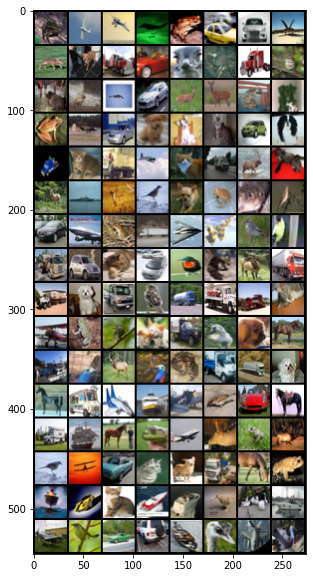

Predictions


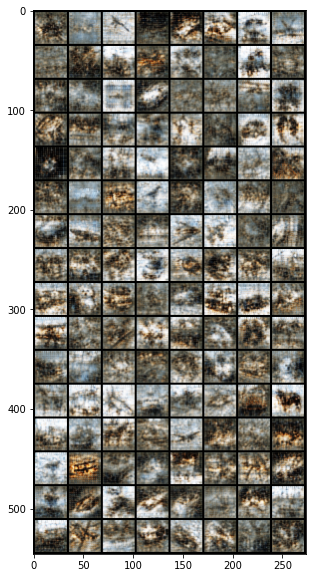

In [21]:
model = CNNAutoEncoder_10().to(device)
model = train_models_auto(model, 'CNN_AutoEncoder_10')

In [24]:
from sklearn.neighbors import KNeighborsClassifier

In [31]:
class KNN():
    def __init__(self, model):
        self.model = model
        self.k = 5

    def make_knn(self, X_train, X_test, y_train, y_test):
        self.knn = KNeighborsClassifier()
        self.knn.fit(X_train, y_train)
        pred = self.knn.predict(X_test)
        print(f"Accuracy Score on test set: {accuracy_score(pred, y_test)}")

    def knn_perform_util(self, dataloader):
        model.eval()
        self.encode_list = list()
        with torch.no_grad():
            out_loss = 0
            for batch_idx, (data, target) in enumerate(dataloader):
                data = data.to(device)
                target = target.to(device)
                e, d = self.model(data)
                e = e.cpu().detach().numpy().tolist()
                self.encode_list += e
        return self.encode_list

    def knn_perf(self):
        e_train = self.knn_perform_util(new_train_loader)
        e_test = self.knn_perform_util(new_test_loader)
        self.make_knn(e_train, e_test, new_train_dataset_target, new_test_dataset_target)

In [30]:
k = KNN(model)
k.knn_perf()

Accuracy Score on training set: 0.4559


In [32]:
k = KNN(model)
k.knn_perf()

Accuracy Score on test set: 0.207


### Analysis

Train Accuracy: 0.4559

Test Accuracy: 0.207

We see that the accuracies are low. This can be due to the fact that the representation size is too small. Due to this, the autoencoder is not able to learn a good representation of the input data. This is also evident from the fact that the reconstructed images are not very good. Increasing the representation size might improve the accuracy.

## Part 3: Siamese Network (not part of assignment)
Siamese networks are useful for comparing and finding similarities between two inputs. The inputs from identical encoder sub-networks will be given as an input to a dense network (an MLP) and the prediction will be given as output of a Sigmoid function.

Employ the encoder from the best model to be used as the two-identical sub-networks of the Siamese Network. So, copy the weights from the best encoder to the two-identical sub-networks, set the learning rate of this encoder to be lower by a couple of order than that of the dense network.

Who knows, this might be part of next assignment during hectic times. (wink wink)
(Don't quote me on this though)

### Step one: Define a Siamese Network

In [ ]:
# sample.
class SiameseNetwork(nn.Module):
    def __init__(self, encoder):
        super().__init__()
        self.encoder1 = encoder
        self.encoder2 = encoder
        self.decoder = nn.Sequential(
            nn.Linear(2048,1024),
            # whatever
        )

    def forward(self, x1, x2):
        encoded1 = self.encoder1(x1)
        encoded2 = self.encoder2(x2)
        return (encoded1,encoded2)
        
    def differentiate(self, x1_embedding, x2_embedding):
        x = torch.cat([x1_embedding,x2_embedding],dim=1)
        return self.decoder(x)


### Step two: Define the following three losses:
1. TripletLoss
2. ContrastiveLoss
3. Regularized Cross Entropy Loss

In [ ]:
# TripletLoss defined as an example
class TripletLoss(nn.Module):
    def __init__(self, margin):
        super(TripletLoss, self).__init__()
        self.margin = margin

    def forward(self, anchor, positive, negative):
        # Compute the distances between the anchor, positive, and negative examples
        distance_pos = F.pairwise_distance(anchor, positive, p=2)
        distance_neg = F.pairwise_distance(anchor, negative, p=2)
        # Compute the triplet loss using the margin
        loss_triplet = torch.mean(torch.clamp(distance_pos - distance_neg + self.margin, min=0.0))
        return loss_triplet

In [ ]:
# code here

### Train the Siamese network...
... and write a function that takes 2 inputs and outputs whether they belong to the same class or not. Plot and share the results of the function. The results should contain both successful results, i.e. classification as 'same' for inputs belonging to the same class and classification as 'not-same' for inputs belonging to different classes, as well as some unsuccessful results (that gives the wrong output than expected).
Provide an explanation of why the unsuccessful results might occur.

In [ ]:
# code and analysis here

### And again. What did we learn?
Discuss any and all learnings here. The discussions must be all-encompassing so that we know what did you learn. 

To re-iterate: "Please do not copy from your friend or copy-paste from the internet. We can see repetitions during evaluations."